# Prime After Prime

This notebook explores correlations among the residues modulo $m$ of consecutive prime numbers. The notebook is an accompaniment to the article "[Prime After Prime](http://bit-player.org)" published at bit-player.org on May 31, 2016. These correlations are *not* my discovery; they were first fully described and analyzed by Robert J. Lemke Oliver and Kannan Soundararajan in March 2016. For the mathematical background, see their arXiv preprint: [Unexpected Biases in the Distribution of Consecutive Primes](http://arxiv.org/abs/1603.03720). 

The code is written in the [Julia programming language](http://julialang.org/) within a [Jupyter notebook](http://jupyter.org/). I began work in Julia version 0.4.2 and in midstream updated to version 0.4.5.

This is my first nontrivial project in Julia, and I welcome all advice, bug reports, and improvements. Please open an issue or send a pull request on GitHub or send email to [brian@bit-player.org](mailto:brian@bit-player.org).

   -- Brian Hayes

### Imports

In [1]:
using Gadfly  # the Julia version of the ggplot2 graphics package

using Colors  # for color keys and color maps in graphics

using Cairo   # for graphics conversions, eg SVG --> PNG

import Base.show    # for interactive use, examining large matrices

using DataArrays, DataFrames # 2D arrays with named columns; hard to use Gadfly without them



### Generating consecutive primes

In producing lists of consecutive primes, the basic idea is to start with an arbitrary integer and examine each subsequent odd integer, checking to see if it's prime. The checking is done with the Miller-Rabin probabalistic test, which in Julia is implemented by the built-in function `isprime()`. The Millar-Rabin test has a tiny probability of error, at a level that would have no impact at all on the statistics of interest here.

In [2]:
# return the next prime after x

function next_prime(x::Union{BigInt, Int})
    x += iseven(x) ? 1 : 2
    while !isprime(x)
        x += 2
    end
    return x
end

next_prime (generic function with 1 method)

We're using Julia's BigInts since we're going to want to play with primes that exceed the capacity of machine numbers. There is no automatic conversion to BigInts when an ordinary Int overflows, so we have to be explicit with the `big()` function.

In [3]:
# return a random BigInt with the specified number of digits
# in the specified base.

function random_big(digits, base)
    return rand(big(base)^(digits - 1):big(base)^digits)
end

random_big (generic function with 1 method)

Generate a sequence of consecutive primes and store them in a text file, one number per line. If `seed` is specified, the sequence will begin with the next prime after `seed`. Otherwise the starting point is the first prime after a randomly chosen integer of `digits` decimal digits. 

The filename is constructed from the arguments. For example, `generate_primes(35, 10000, "primes")` yields a file named `primes-35-10000-nnnnnnn`, where `nnnnnnn` is the first seven digits of the first prime in the sequence.

The convenience function `generate_myriads` yields files holding 10,000 `d`-digit primes for each `d` from `start` to `finish` inclusive.

In [4]:
function generate_primes(digits, reps, filename_prefix, seed=0)
    seed = seed > 0 ? BigInt(seed) : random_big(digits, 10)
    first = next_prime(seed)
    p = first
    label = string(first)
    label = length(label) > 7 ? label[1:7] : label
    filename = join([filename_prefix, digits, reps, label, "txt"], "-", ".")
    open(filename, "w") do f
        for i = 1:reps
            println(f, p)
            p = next_prime(p)
        end
    end
    return filename
end

generate_primes (generic function with 2 methods)

In [5]:
function generate_myriads(start, finish)
    for d = start:finish
        generate_primes(d, 10000, "myriads/primes")
    end
end

generate_myriads (generic function with 1 method)

Read all the primes in a file into an array of BigInts.

In [6]:
function read_primes_from_file(filename)
    primes = Array{BigInt}(0)
    open(filename, "r") do f
        while !eof(f)
            # chomp removes the newline char
            p = parse(BigInt, chomp(readline(f)))
            push!(primes, p)
        end
    end
    return primes
end

read_primes_from_file (generic function with 1 method)



## Analyzing primes modulo _m_

From a vector of consecutive primes, tabulate the number of residues in each possible congruence class mod $m$, along with the number of pairs $(p_{i} \bmod m, p_{i+1} \bmod m)$. Display the counts in tables and graphics.

In [102]:
# given a path to a file of consecutive primes and an integer m,
# returns a statistical analysis of the primes mod m, organized
# as a data dictionary

function calc_primes_d_mod_m(filename, m)
    
    # read the file of primes into a vector
    primes = read_primes_from_file(filename)
    
    # associative structure to hold all data on primes
    d = Dict()
    
    # identify the source of the primes and the modulus
    d[:filename] = filename
    d[:m] = m
    
    # set of integers that are possible residues for a prime p mod m
    d[:congruence_classes] = collect_congruence_classes(m)
    
    # number of primes in the file
    d[:prime_count] = length(primes)
    
    # first, last, and middle primes in the file
    d[:first_prime] = primes[1]
    d[:last_prime] = primes[end]
    d[:median_prime] = primes[div(end, 2)]
    
    # log10 of the median will become x coordinate in certain graphs
    d[:magnitude] = Float64(log10(d[:median_prime]))
    d[:digits] = round(Int, (ceil(d[:magnitude])))
    
    # arrays of zeros to hold counts of residue classes and consecutive pairs
    class_counts = zeros(Int, m)
    pair_counts = zeros(Int, (m, m))
    
    # loop through the primes mod m, recording the number in
    # each congruence class and the number of each p_{i}, p_{i+1} 
    # pair of successive primes; adjust indices to translate
    # from 0:m-1 range of modular values to 1:m range of Julia arrays.
    prev = primes[1] % m
    class_counts[prev + 1] += 1
    for i = 2:length(primes)
        next = primes[i] % m
        class_counts[next + 1] += 1
        pair_counts[prev + 1, next + 1] += 1
        prev = next
    end
    
    # store the counts in the dictionary
    d[:class_counts] = class_counts
    d[:pair_counts] = pair_counts
    
    # results above include zero entries for impossible congruence
    # classes; here we separately record a vector and a matrix without
    # the zero entries
    d[:nz_class_counts] = nonzero_class_counts(class_counts, d[:congruence_classes])
    d[:nz_pair_counts] = nonzero_pair_counts(pair_counts, d[:congruence_classes])
    
    # normalize the results to allow comparisons of samples of different sizes
    mc = mean(d[:nz_class_counts])
    mp = mean(d[:nz_pair_counts])
    d[:norm_class_counts] = map(x -> (x - mc) / mc, d[:class_counts])
    d[:norm_pair_counts] = map(x -> (x - mp) / mp, d[:pair_counts])
    d[:norm_nz_class_counts] = map(x -> (x - mc) / mc, d[:nz_class_counts])
    d[:norm_nz_pair_counts] = map(x -> (x - mp) / mp, d[:nz_pair_counts])
    
    # elementary stats on the normalized results
    d[:norm_class_counts_mean] = mean(d[:norm_nz_class_counts])
    d[:norm_class_counts_std] = std(d[:norm_nz_class_counts])
    d[:norm_pair_counts_mean] = mean(d[:norm_nz_pair_counts])
    d[:norm_pair_counts_std] = std(d[:norm_nz_pair_counts])
    d[:diag_ratio] = diagonal_ratio(d[:nz_pair_counts])
    return d
end

calc_primes_d_mod_m (generic function with 1 method)

In [106]:
c = calc_primes_d_mod_m("myriads/primes-10-10000-3529097.txt", 7)

Dict{Any,Any} with 22 entries:
  :first_prime            => 3529097227
  :norm_pair_counts_mean  => -1.5419764230904951e-18
  :digits                 => 10
  :diag_ratio             => 1.774136229022705
  :class_counts           => [0,1642,1673,1644,1654,1670,1717]
  :congruence_classes     => [1,2,3,4,5,6]
  :nz_pair_counts         => 6x6 Array{Int64,2}:…
  :norm_class_counts_std  => 0.016686761219601602
  :filename               => "myriads/primes-10-10000-3529097.txt"
  :norm_pair_counts       => 7x7 Array{Float64,2}:…
  :norm_pair_counts_std   => 0.23817544991395082
  :nz_class_counts        => [1642,1673,1644,1654,1670,1717]
  :norm_nz_pair_counts    => 6x6 Array{Float64,2}:…
  :norm_class_counts_mean => -4.568105153405592e-17
  :prime_count            => 10000
  :last_prime             => 3529318979
  :median_prime           => 3529207063
  :magnitude              => 9.547677139708853
  :m                      => 7
  :norm_class_counts      => [-1.0,-0.014800000000000044,0.003799

In [107]:
c[:nz_pair_counts]

6x6 Array{Int64,2}:
 172  257  337  263  324  289
 370  177  224  292  260  350
 242  380  144  248  313  317
 333  261  343  179  229  308
 242  352  279  373  156  268
 283  246  317  299  387  185

In [8]:
# Given a value of m, return a vector of all possible
# congruence classes for p mod m, where p is a prime > m.
# When m is prime, the vector will consist of the range
# 1:m-1, but for composite m there may be missing values.
# For example, congruence_classes(10) = [1, 3, 7, 9]

function collect_congruence_classes(m)
    classes = Array{Int64}(0)
    for i = 1:m
        if gcd(i, m) == 1
            push!(classes, i)
        end
    end
    return classes
end

collect_congruence_classes (generic function with 1 method)

In [9]:
function nonzero_class_counts(class_counts, classes)
    n = length(classes)
    nz_counts = zeros(Int64, n)
    for i = 1:n
        nz_counts[i] = class_counts[classes[i] + 1]
    end
    return nz_counts
end

nonzero_class_counts (generic function with 1 method)

In [10]:
function nonzero_pair_counts(pair_counts, classes)
    n = length(classes)
    nz_counts = zeros(Int64, n, n)
    for i = 1:n
        for j = 1:n
            nz_counts[i, j] = pair_counts[classes[i] + 1, classes[j] + 1]
        end
    end
    return nz_counts
end

nonzero_pair_counts (generic function with 1 method)

In [97]:
# calculate the mean value of all off-diagonal elements and the
# mean of the on-diagonal elements; return the ratio of off/on

function diagonal_ratio(count_matrix)
    n = size(count_matrix, 1)
    diagonal_sum = 0
    for i = 1:n
        diagonal_sum += count_matrix[i, i]
    end
    off_diagonal_sum = sum(count_matrix) - diagonal_sum
    return (off_diagonal_sum / (n^2 - n)) / (diagonal_sum / n)
end

diagonal_ratio (generic function with 1 method)

### The million primes example data set

In [ ]:
generate_primes(8, 1000000, "millions/primes", 10000000)

In [ ]:
p8million1000001mod7 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 7);

In [ ]:
p8million1000001mod7[:nz_class_counts]

In [ ]:
sum(p8million1000001mod7[:nz_class_counts])

In [ ]:
p8million1000001mod7[:class_counts]

In [ ]:
[x - 166667 for x in p8million1000001mod7[:nz_class_counts]]

In [ ]:
std(p8million1000001mod7[:nz_class_counts])

In [ ]:
p8million1000001mod7[:nz_pair_counts]

In [ ]:
map(x -> x - 27778, p8million1000001mod7[:nz_pair_counts])

In [ ]:
std(p8million1000001mod7[:nz_pair_counts])

In [ ]:
p8million1000001mod3 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 3);

In [ ]:
p8million1000001mod3[:nz_pair_counts]

In [ ]:
p8million1000001mod10 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 10);

In [ ]:
p8million1000001mod10[:nz_pair_counts]

In [ ]:
p8million1000001mod13 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 13);

In [ ]:
p8million1000001mod17 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 17);

In [31]:
p8million1000001mod19 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 19)

Dict{Any,Any} with 22 entries:
  :first_prime            => 10000019
  :norm_pair_counts_mean  => 5.44831669491975e-17
  :digits                 => 8
  :diag_ratio             => -0.05882352941176477
  :class_counts           => [0,55528,55646,55642,55493,55579,55542,55494,55432…
  :congruence_classes     => [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18]
  :nz_pair_counts         => 18x18 Array{Int64,2}:…
  :norm_class_counts_std  => 0.0013489509649658705
  :filename               => "millions/primes-8-1000000-1000001.txt"
  :norm_pair_counts       => 19x19 Array{Float64,2}:…
  :norm_pair_counts_std   => 0.6799071507900735
  :nz_class_counts        => [55528,55646,55642,55493,55579,55542,55494,55432,5…
  :norm_nz_pair_counts    => 18x18 Array{Float64,2}:…
  :norm_class_counts_mean => 1.450421572969497e-17
  :prime_count            => 1000000
  :last_prime             => 26683507
  :median_prime           => 18222703
  :magnitude              => 7.26061279694638
  :m                    

In [ ]:
p8million1000001mod23 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 23);

In [ ]:
p8million1000001mod31 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 31);

In [ ]:
p8million1000001mod20 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 20);

In [ ]:
p8million1000001mod16 = calc_primes_d_mod_m("millions/primes-8-1000000-1000001.txt", 16);

In [53]:
# using the file of a million 40-digit primes
p40million9166432mod19 = calc_primes_d_mod_m("millions/primes-40-1000000-9166432.txt", 19);

In [54]:
# using the file of a million 100-digit primes
p100million1256742mod19 = calc_primes_d_mod_m("millions/primes-100-1000000-1256742.txt", 19);

In [55]:
# using the file of a million 400-digit primes
p400million6567379mod19 = calc_primes_d_mod_m("millions/primes-400-1000000-6567379.txt", 19);

In [83]:
# using the file of a million 400-digit primes
p400million6567379mod31 = calc_primes_d_mod_m("millions/primes-400-1000000-6567379.txt", 31);

In [85]:
# using the file of a million 400-digit primes
p400million6567379mod61 = calc_primes_d_mod_m("millions/primes-400-1000000-6567379.txt", 61);

In [175]:
# using the file of a million 400-digit primes
p400million6567379mod3 = calc_primes_d_mod_m("millions/primes-400-1000000-6567379.txt", 3)

Dict{Any,Any} with 22 entries:
  :first_prime            => 65673792794252156030709598196752517924735264743615…
  :norm_pair_counts_mean  => 1.0842021724855044e-19
  :digits                 => 400
  :diag_ratio             => 1.0090628917676556
  :class_counts           => [0,499419,500581]
  :congruence_classes     => [1,2]
  :nz_pair_counts         => 2x2 Array{Int64,2}:…
  :norm_class_counts_std  => 0.0016433161594775366
  :filename               => "millions/primes-400-1000000-6567379.txt"
  :norm_pair_counts       => 3x3 Array{Float64,2}:…
  :norm_pair_counts_std   => 0.005543724031045214
  :nz_class_counts        => [499419,500581]
  :norm_nz_pair_counts    => 2x2 Array{Float64,2}:…
  :norm_class_counts_mean => 0.0
  :prime_count            => 1000000
  :last_prime             => 65673792794252156030709598196752517924735264743615…
  :median_prime           => 65673792794252156030709598196752517924735264743615…
  :magnitude              => 399.8173920983958
  :m                   

In [176]:
p400million6567379mod3[:pair_counts]

3x3 Array{Int64,2}:
 0       0       0
 0  248291  251128
 0  251127  249453

In [172]:
# using the file of 10 million 40-digit primes
p40_10million_5053744_mod61 = calc_primes_d_mod_m("millions/primes-40-10000000-5053744.txt", 61);

### Graphics



In [12]:
function heatmap(d::Dict)
    mat = clamp_colors(d[:norm_nz_pair_counts])
    labels = d[:congruence_classes]
    spy(mat,
        Scale.x_discrete(labels = x -> string(labels[x])),
        Scale.y_discrete(labels = y -> string(labels[y])),
        Guide.xlabel("j = second prime mod " * string(d[:m])),
        Guide.ylabel("i = first prime mod " * string(d[:m]), orientation=:vertical),
        Guide.title("normalized counts of consecutive " * string(d[:digits]) * "-digit primes mod " * string(d[:m])),
        Guide.colorkey(""),
        Scale.color_continuous(colormap = colorfn, minvalue = -1.0, maxvalue = 1.0))
end

heatmap (generic function with 1 method)

In [13]:
function heatmap_z(d::Dict)
    mat = clamp_colors(d[:norm_pair_counts])
    labels = collect(0:d[:m] - 1)
    spy(mat,
        Scale.x_discrete(labels = x -> string(labels[x])),
        Scale.y_discrete(labels = y -> string(labels[y])),
        Guide.xlabel("j = second prime mod " * string(d[:m])),
        Guide.ylabel("i = first prime mod " * string(d[:m]), orientation=:vertical),
        Guide.title("normalized counts of consecutive " * string(d[:digits]) * "-digit primes mod " * string(d[:m])),
        Guide.colorkey(""),
        Scale.color_continuous(colormap = colorfn, minvalue = -1.0, maxvalue = 1.0))
end

heatmap_z (generic function with 1 method)

In [14]:
function colorfn(x)
    if x == 0.0
        return RGB(0.5, 0.5, 0.5)
    else
        index = round(Int, min(200, 1 + 200x))
        return Colors.diverging_palette(245.0, 10.0, 200, wcolor=RGB(1,0,0), c=0.7)[index]
    end
end

colorfn (generic function with 1 method)

In [15]:
function clamp_colors(mat)
    max_value = maximum(mat)
    if max_value > 1
        adjusted_mat = similar(mat)
        for i in eachindex(mat)
            if mat[i] > 0
                adjusted_mat[i] = mat[i] / max_value
            else
                adjusted_mat[i] = mat[i]
            end
        end
        return adjusted_mat
    end
    return mat
end

clamp_colors (generic function with 1 method)

In [ ]:
Gadfly.set_default_plot_size(400pt, 400pt);

In [ ]:
hm7 = heatmap(p8million1000001mod7)

In [ ]:
hm7z = heatmap_z(p8million1000001mod7)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-7.svg", 400pt, 400pt), hm7)

In [ ]:
hm3 = heatmap(p8million1000001mod3)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-3.svg", 300pt, 300pt), hm3)

In [ ]:
hm10 = heatmap(p8million1000001mod10)

In [ ]:
hm10z = heatmap_z(p8million1000001mod10)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-10.svg", 300pt, 300pt), hm10)

In [ ]:
hm13 = heatmap(p8million1000001mod13)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-13.svg", 400pt, 400pt), hm13)

In [ ]:
hm17 = heatmap(p8million1000001mod17)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-17.svg", 400pt, 400pt), hm17)

In [ ]:
hm19 = heatmap(p8million1000001mod19)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-19.svg", 400pt, 400pt), hm19)

In [ ]:
hm23 = heatmap(p8million1000001mod23)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-23.svg", 400pt, 400pt), hm23)

In [ ]:
hm31 = heatmap(p8million1000001mod31)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-31.svg", 500pt, 500pt), hm31)

In [ ]:
hm16 = heatmap_z(p8million1000001mod16)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-primes-1000001-mod-16.svg", 400pt, 400pt), hm16)

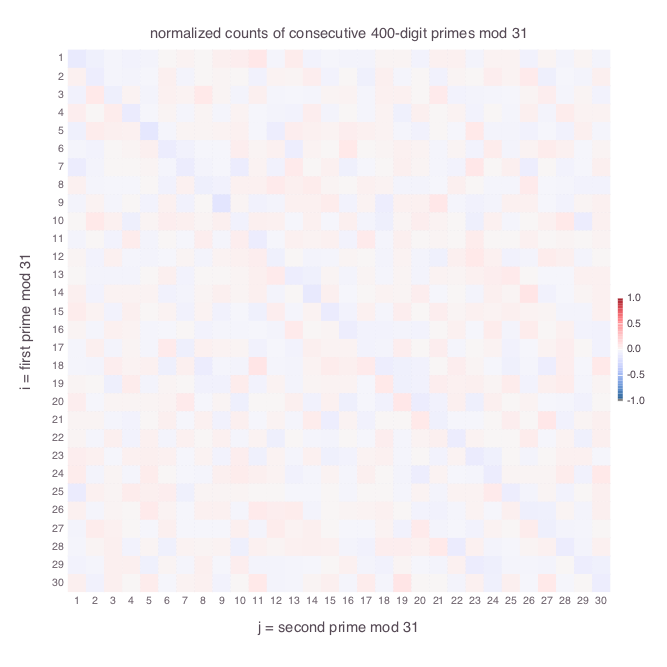

In [84]:
Gadfly.set_default_plot_size(500pt, 500pt)
hm31p400 = heatmap(p400million6567379mod31)

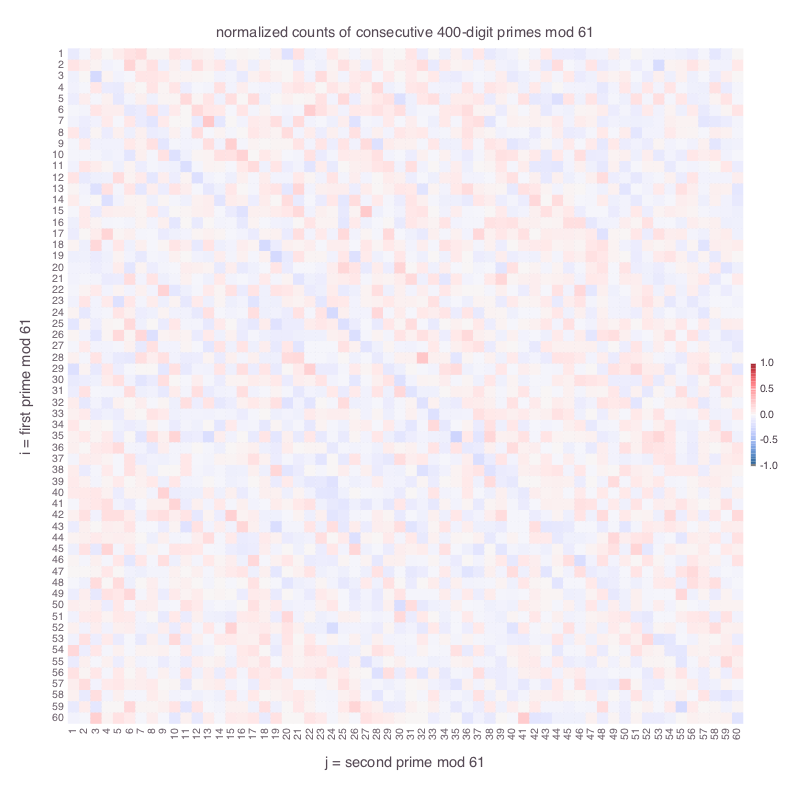

In [86]:
Gadfly.set_default_plot_size(600pt, 600pt)
hm61p400 = heatmap(p400million6567379mod61)

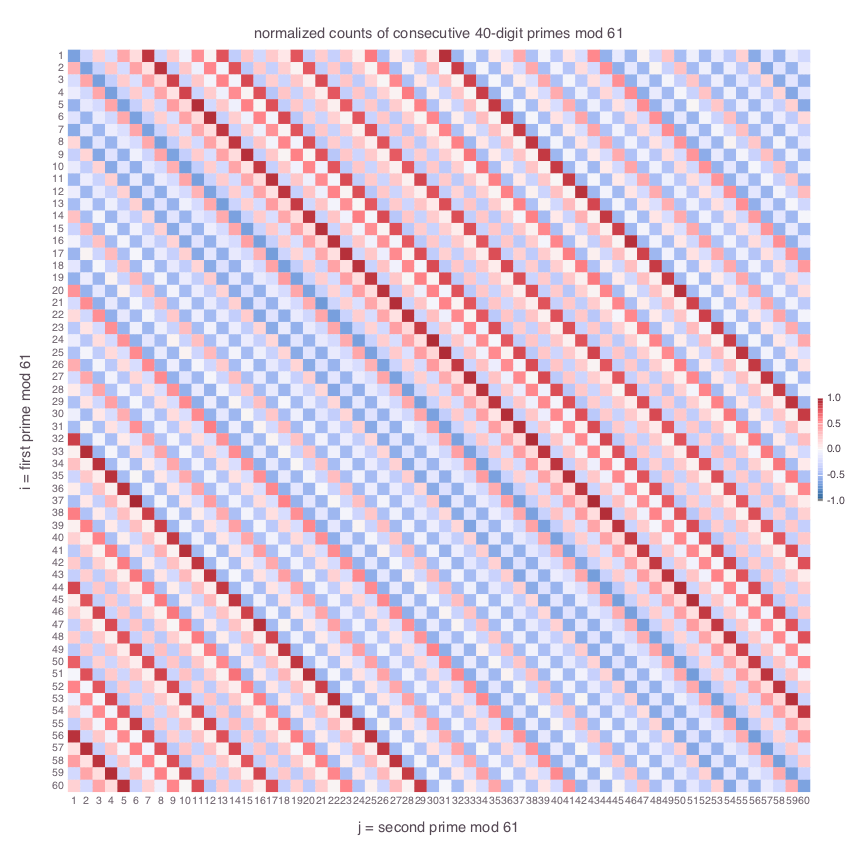

In [173]:
Gadfly.set_default_plot_size(650pt, 650pt)
hm61p40_10million = heatmap(p40_10million_5053744_mod61)

In [174]:
draw(SVG("graphics/heatmap-40-digit-primes-5053744-mod61.svg", 500pt, 500pt), hm61p40_10million)

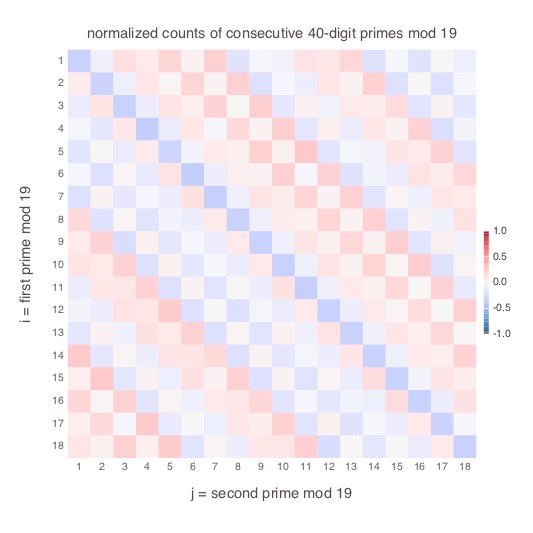

In [56]:
Gadfly.set_default_plot_size(400pt, 400pt)
hm19p40 = heatmap(p40million9166432mod19)

In [57]:
draw(SVG("graphics/heatmap-40-digit-primes-9166432-mod-19.svg", 400pt, 400pt), hm19p40)

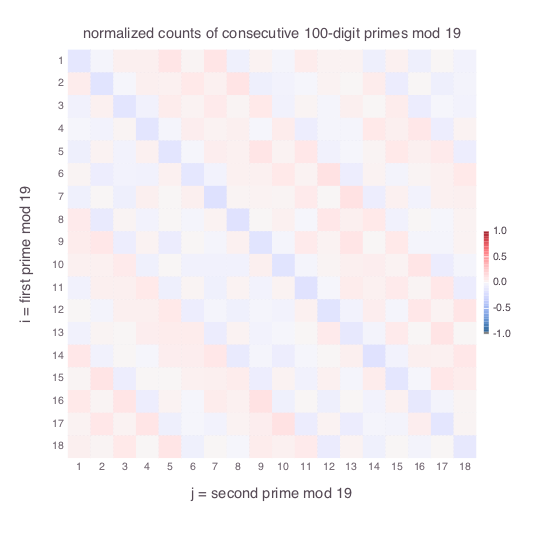

In [58]:
hm19p100 = heatmap(p100million1256742mod19)

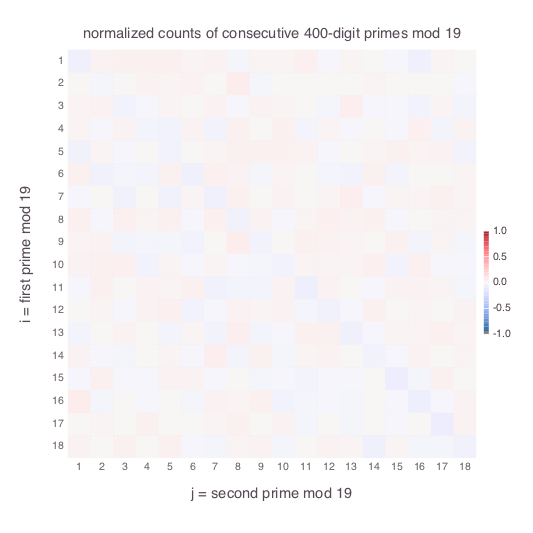

In [59]:
hm19p400 = heatmap(p400million6567379mod19)

In [60]:
draw(SVG("graphics/heatmap-400-digit-primes-6567379-mod-19.svg", 400pt, 400pt), hm19p400)

### The twist transformation

In [16]:
function twist(mat)
    rows, cols = size(mat)
    newmat = similar(mat)
    for i = 1:rows
        for j = 1:cols
            k = j + i - 1
            if k > cols
                k -= cols
            end
            newmat[i, j] = mat[i, k]
        end
    end
    return newmat
end

twist (generic function with 1 method)

In [17]:
function twisted_heatmap(d::Dict)
    mat = twist(clamp_colors(d[:norm_nz_pair_counts]))
    xlabels = [x - 1 for x in d[:congruence_classes]]
    ylabels = d[:congruence_classes]
    spy(
    mat,
    Scale.x_discrete(labels = x -> string(xlabels[x])),
    Scale.y_discrete(labels = y -> string(ylabels[y])),
    Guide.xlabel("j = interval between primes mod " * string(d[:m])),
    Guide.ylabel("i = first prime mod " * string(d[:m]), orientation=:vertical),
    Guide.title("twisted counts of consecutive " * string(d[:digits]) * "-digit primes mod " * string(d[:m])),
    Guide.colorkey(""),
    Scale.color_continuous(colormap = colorfn, minvalue = -1.0, maxvalue = 1.0))
end

twisted_heatmap (generic function with 1 method)

In [18]:
function twisted_heatmap_zeros(d::Dict)
    mat = twist(clamp_colors(d[:norm_pair_counts]))
    labels = collect(0:d[:m] - 1)
    spy(
    mat,
    Scale.x_discrete(labels = x -> string(labels[x])),
    Scale.y_discrete(labels = y -> string(labels[y])),
    Guide.xlabel("j = interval between primes mod " * string(d[:m])),
    Guide.ylabel("i = first prime mod " * string(d[:m]), orientation=:vertical),
    Guide.title("twisted counts of consecutive " * string(d[:digits]) * "-digit primes mod " * string(d[:m])),
    Guide.colorkey(""),
    Scale.color_continuous(colormap = colorfn, minvalue = -1.0, maxvalue = 1.0))
end

twisted_heatmap_zeros (generic function with 1 method)

In [ ]:
Gadfly.set_default_plot_size(400pt, 400pt)
twisted_hm19_nz = twisted_heatmap(p8million1000001mod19)

In [ ]:
draw(SVG("graphics/twisted-nz-heatmap-8-digit-primes-1000001-mod-19.svg", 400pt, 400pt), twisted_hm19_nz)

In [ ]:
hm19z = heatmap_z(p8million1000001mod19)

In [ ]:
draw(SVG("graphics/heatmap-z-8-digit-primes-1000001-mod-19.svg", 400pt, 400pt), hm19z)

In [ ]:
twisted_hm19_z = twisted_heatmap_zeros(p8million1000001mod19)

In [ ]:
draw(SVG("graphics/twisted-z-heatmap-8-digit-primes-1000001-mod-19.svg", 400pt, 400pt), twisted_hm19_z)

### Plot column sums of twisted matrix

In [19]:
function sum_columns(d::Dict)
    mat = twist(d[:pair_counts])
    x, y = size(mat)
    sums = zeros(Int, x)
    for i = 1:x
        sums[i] = sum(mat[:, i])
    end
    return sums
end

sum_columns (generic function with 1 method)

In [20]:
function plot_column_sums(d::Dict)
    ys = sum_columns(d)
    xs = collect(1:length(ys))
    xlabels = collect(0:length(ys))
    plot(
    x = xs,
    y = ys, 
    Theme(default_color = RGB(0.6, 0.6, 0.6), bar_spacing = 2pt),
    Guide.xlabel("ẟ = interval between consecutive primes mod " * string(d[:m])),
    Guide.ylabel("count of primes mod " * string(d[:m]), orientation = :vertical),
    Scale.x_discrete(labels = x -> xlabels[x]),
    Scale.y_continuous(format=:plain),
    Geom.bar)
end

plot_column_sums (generic function with 1 method)

In [ ]:
Gadfly.set_default_plot_size(400pt, 350pt)
column_sums_twisted = plot_column_sums(p8million1000001mod19)

In [ ]:
draw(SVG("graphics/column-sums-twisted-8-digit-primes-1000001-mod-19.svg", 400pt, 350pt), column_sums_twisted)

### Histogram of distances between primes

Here we briefly leave behind primes mod _n_ and return to the primes themselves, tabulating the intervals between them.

In [21]:
# Get first differences of primes in a file, record counts in an array

function count_prime_diffs(filename)
    primes = read_primes_from_file(filename)
    diffs = map(x -> convert(Int, x), diff(primes))
    maxgap = maximum(diffs)
    counts = zeros(Int, maxgap)
    for d in diffs
        counts[d] += 1
    end
    return counts
end

count_prime_diffs (generic function with 1 method)

In [22]:
# Convert the array returned by count_prime_diffs to a dataframe,
# for use by plot_diffs. 
# 
# diff_counts is the array returned by count_prime_diffs
# m is the modulus used for demarcating tranches
# tranches is the number of tranches to be shown

function diffs_dataframe(diff_counts, m, tranches)
    df = DataFrame()
    df[:idx] = 0:length(diff_counts)
    df[:idx_mod_m] = df[:idx] % m
    df[:counts] = [0; diff_counts]   # prepend a zero
    df[:tranche] = min(div(df[:idx], m), tranches) * m
    return df
end

diffs_dataframe (generic function with 1 method)

In [155]:
# diff_counts is the dataframe returned by diffs_dataframe
# maxidx is the largest difference to show in the plot
# x_label_interval determines how many bars are labeled
# m is the modulus, or the length of a tranche; if m = 0,
#   we show all diffs from 0 to maxidx; if m > 0 we "fold"
#   the graph so that groups of m bars are superimposed (or
#   rather stacked).

function plot_diffs(diff_counts::DataFrame, maxidx, y_max, x_label_interval = 2, m = 0)
    xlbl = (m == 0) ? "ẟ = interval between consecutive primes" : 
    "ẟ = interval (mod " * string(m) * ") between consecutive primes"
    plot(
    diff_counts[1:maxidx + 1, :],
    x = (m == 0) ? :idx : :idx_mod_m,
    y = :counts,
    color = :tranche,
    Theme(default_color = RGB(0.6, 0.6, 0.6), bar_spacing = 1pt),
    Guide.xlabel(xlbl),
    Guide.ylabel("count", orientation = :vertical),
    Scale.y_continuous(format = :plain, maxvalue = y_max),
    Scale.x_discrete(labels = x -> x % x_label_interval == 0 ? string(x) : ""),
    Scale.color_discrete(),
    Geom.bar)
end

plot_diffs (generic function with 4 methods)

In [63]:
df_8_19 = diffs_dataframe(count_prime_diffs("millions/primes-8-1000000-1000001.txt"), 19, 4);

In [ ]:
Gadfly.set_default_plot_size(500pt, 350pt)
diffs8df = plot_diffs(df_8_19, 60, 2, 0)

In [ ]:
draw(SVG("graphics/diffs-8-digit-primes-1000001-color.svg", 500pt, 350pt), diffs8df)

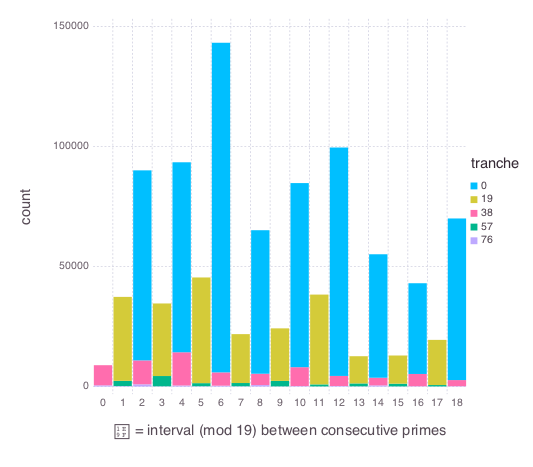

In [156]:
Gadfly.set_default_plot_size(400pt, 350pt)
diffs8dfmod19 = plot_diffs(df_8_19, 210, 150000, 1, 19)

In [ ]:
draw(SVG("graphics/diffs-8-digit-primes-1000001-color-stacked-mod-19.svg", 400pt, 350pt), diffs8dfmod19)

In [ ]:
df_8_10 = diffs_dataframe(count_prime_diffs("millions/primes-8-1000000-1000001.txt"), 10, 5)

In [ ]:
Gadfly.set_default_plot_size(500pt, 350pt)
diffs8df10 = plot_diffs(df_8_10, 60, 2, 0)

In [ ]:
Gadfly.set_default_plot_size(400pt, 350pt)
diffs8df10 = plot_diffs(df_8_10, 210, 1, 10)

In [ ]:
Gadfly.set_default_plot_size(400pt, 350pt)
column_sums_twisted = plot_column_sums(p8million1000001mod19)

In [ ]:
draw(SVG("graphics/diffs-8-digit-primes-1000001.svg", 600pt, 350pt), diffs8)

In [32]:
diffs40 = count_prime_diffs("millions/primes-40-1000000-9166432.txt")
diffs40'

1x1328 Array{Int64,2}:
 0  14181  0  14363  0  27784  0  …  0  0  0  0  0  0  0  0  0  0  0  1

In [39]:
diffs40df = diffs_dataframe(diffs40, 19, 12);

In [65]:
diffs40df[:idx][end]

1328

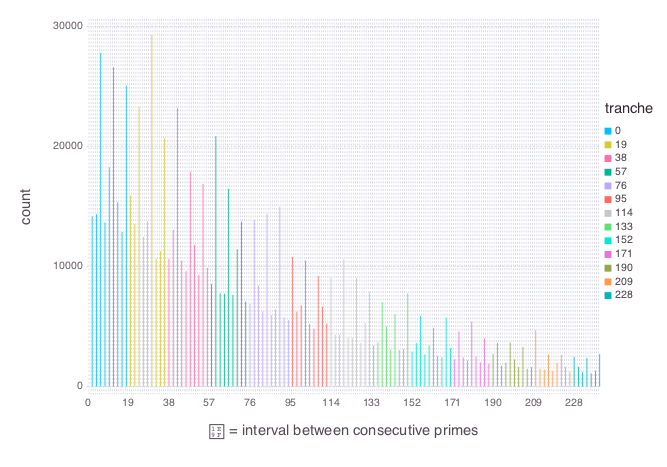

In [68]:
Gadfly.set_default_plot_size(500pt, 350pt)

diffs40plot = plot_diffs(diffs40df, 240, 19)

In [69]:
draw(SVG("graphics/diffs-40-digit-primes-9166432.svg", 500pt, 350pt), diffs40plot)

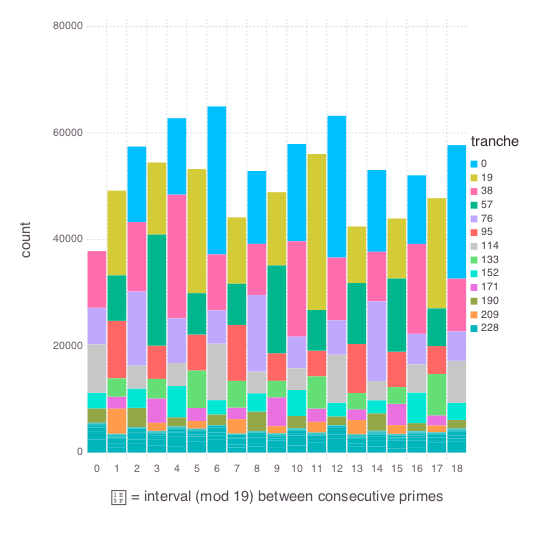

In [157]:
Gadfly.set_default_plot_size(400pt, 400pt)
diffs40mod19 = plot_diffs(diffs40df, 1328, 75000, 1, 19)

In [162]:
draw(SVG("graphics/diffs-40-digit-primes-9166432-stacked-mod-19.svg", 400pt, 400pt), diffs40mod19)

In [36]:
diffs100df =  diffs_dataframe(count_prime_diffs("millions/primes-100-1000000-1256742.txt"), 19, 12);

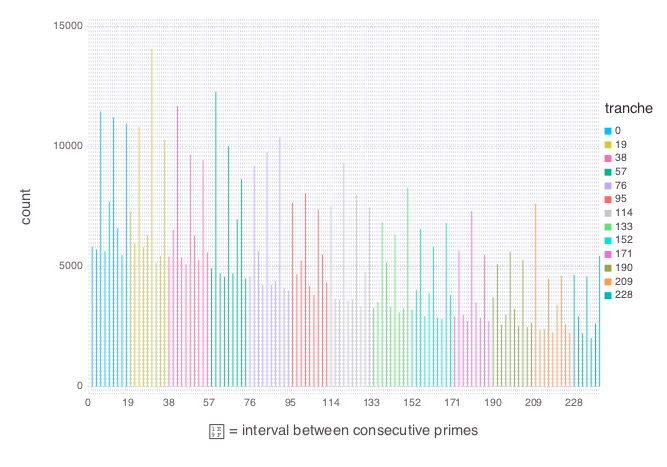

In [41]:
Gadfly.set_default_plot_size(500pt, 350pt)
plot_diffs(diffs100df, 240, 19)

In [42]:
diffs400df =  diffs_dataframe(count_prime_diffs("millions/primes-400-1000000-6567379.txt"), 19, 12);

In [72]:
diffs400df[:idx][end]

15080

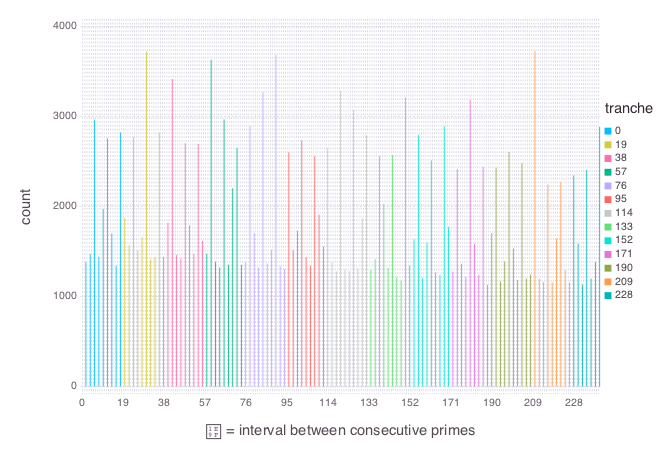

In [70]:
Gadfly.set_default_plot_size(500pt, 350pt)
diffs400plot = plot_diffs(diffs400df, 240, 19)

In [71]:
draw(SVG("graphics/diffs-400-digit-primes-6567379.svg", 500pt, 350pt), diffs400plot)

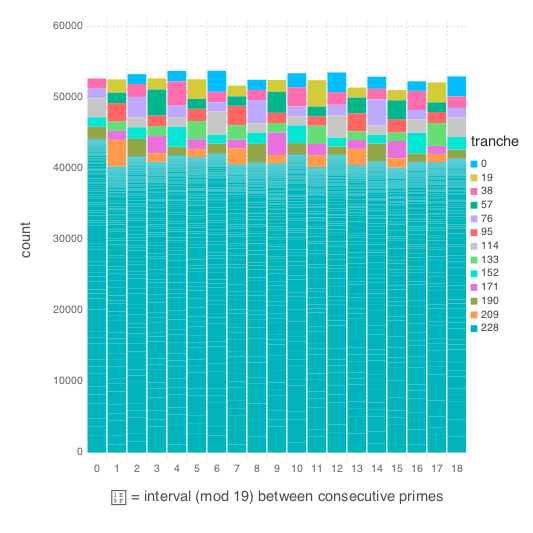

In [165]:
Gadfly.set_default_plot_size(400pt, 400pt)
diffs400mod19 = plot_diffs(diffs400df, 15080, 60000, 1, 19)

In [166]:
draw(SVG("graphics/diffs-400-digit-primes-6567379-stacked-mod-19.svg", 400pt, 400pt), diffs400mod19)

In [ ]:
draw(SVG("graphics/diffs-400-digit-primes-6567379-stacked-mod-19.svg", 400pt, 400pt), diffs400mod19)

### Plotting the off-diagonal/on-diagonal ratio

In [112]:
function list_diagonal_ratios(path, filespec, m)
    filenames = readdir(path)
    ratios = []
    for file in filenames
        if ismatch(filespec, file)
            d = calc_primes_d_mod_m(path * file, m)
            push!(ratios, (d[:magnitude], d[:diag_ratio]))
        end
    end
    sort!(ratios)
    return ratios
end

list_diagonal_ratios (generic function with 1 method)

In [177]:
myriads_ratios_7 = list_diagonal_ratios("myriads/", r"primes", 7);

In [140]:
function plot_diag_ratios(ratios)
    xs = Float64[]
    ys = Float64[]
    for tp in ratios
        push!(xs, tp[1])
        push!(ys, tp[2])
    end
    plot(
    layer(x = xs, y = ys, Geom.point, order = 1, Theme(default_color=RGB(0.2, 0.3, 0.6))),
#     layer(x = xs, y = ys, Geom.smooth(method=:loess, smoothing=0.1), order = 2, 
#     Theme(default_color=RGB(0.7, 0.1, 0.1))),
    layer(yintercept = [1.0], Geom.hline(color=RGB(0.7, 0.1, 0.1)), order = 3),
    Guide.ylabel("off-diagonal / on-diagonal"),
    Guide.xlabel("size of primes (decimal digits)"), 
    Guide.yticks(ticks=collect(0.9:0.1:1.5)))
end

plot_diag_ratios (generic function with 1 method)

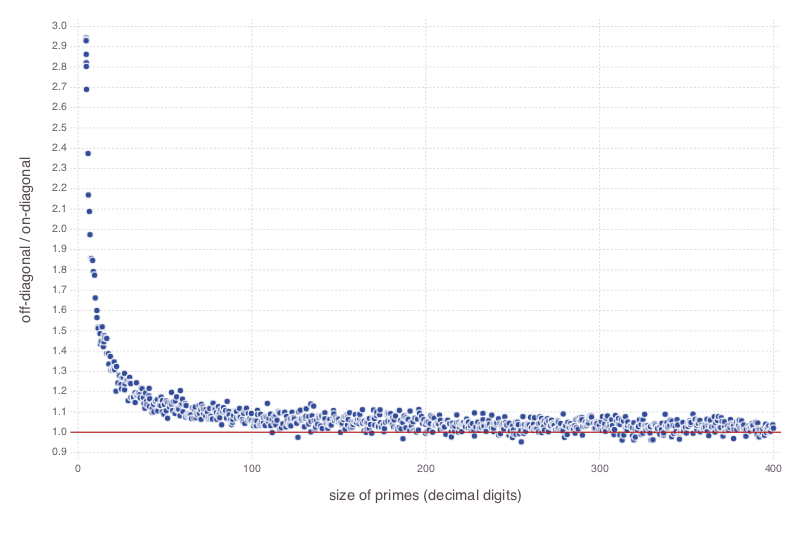

In [138]:
Gadfly.set_default_plot_size(600pt, 400pt)
plot_diag_ratios(myriads_ratios_7)

In [139]:
myriads_ratios_3 = list_diagonal_ratios("myriads/", r"primes", 3)

797-element Array{Any,1}:
 (4.6868060219909005,1.4876835033590445)
 (4.696085416309825,1.4799107142857142) 
 (4.697900323663204,1.478681209717402)  
 (4.748257818725536,1.4694986416399112) 
 (4.786914606730178,1.4707190511489994) 
 (4.792664788851721,1.4707190511489994) 
 (4.908039772917383,1.4694986416399112) 
 (5.807164840619863,1.3416861826697892) 
 (5.9696586207289055,1.3711169077543277)
 (6.568301130912665,1.2970365265334252) 
 (6.9200840187733705,1.2761211017527885)
 (7.320257048247853,1.3108389184192282) 
 (7.818012119282409,1.2719836400817996) 
 ⋮                                      
 (394.79339083505624,0.9886634844868735)
 (394.8501127883922,1.0078313253012048) 
 (395.44177148523676,1.0155210643015522)
 (395.91923428019714,1.0298416565164434)
 (396.08912079062344,1.0002000400080016)
 (396.5924277114711,0.983535012894267)  
 (397.3289041840432,1.0531827515400412) 
 (397.80424845347585,1.00420926037282)  
 (398.3802305186478,1.0054151624548737) 
 (398.96748413341567,1.00060024

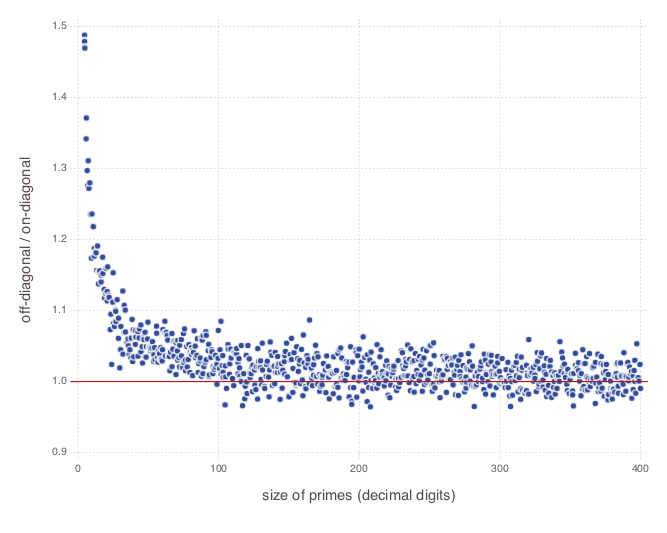

In [144]:
Gadfly.set_default_plot_size(500pt, 400pt)
myriad_diag_ratios_3 = plot_diag_ratios(myriads_ratios_3)

In [145]:
draw(SVG("graphics/myriads_diag_ratios-3.svg", 500pt, 400pt), myriad_diag_ratios_3)

### Cramér primes

Are the patterns observed in consecutive primes mod _m_ really a consequence of primality? Or would similar correlations appear if we analyzed other classes of numbers in the same way? In the 1930s Harald Cramér introduced the study of random numbers that have the same basic distribution as the primes but don't necessarily share the crucial property of being divisible only by 1 and themselves. 

In [24]:
function generate_cramers(start, next_fn, reps, filename_prefix, rng_seed = 0)
    if rng_seed > 0
        srand(rng_seed)
    end
    first = next_fn(start)
    p = first
    label = string(first)
    label = length(label) > 8 ? label[1:7] : label
    filename = join([filename_prefix, digits, reps, label, "txt"], "-", ".")
    open(filename, "w") do f
        for i = 1:reps
            println(f, p)
            p = next_fn(p)
        end
    end
    return filename
end

generate_cramers (generic function with 2 methods)

In [25]:
function next_cramer(n)
    prob = 1 / log(n)
    next = n + 1
    while rand() > prob
        next += 1
    end
    return(next)
end

next_cramer (generic function with 1 method)

In [26]:
function next_semi_cramer(n)
    prob = 2 / log(n)
    next = iseven(n) ? n + 1 : n + 2
    while rand() > prob
        next += 2
    end
    return(next)
end

next_semi_cramer (generic function with 1 method)

In [27]:
function next_demi_semi_cramer(n)
    prob = 3 / log(n)
    next = iseven(n) ? n + 1 : n + 2
    if next % 3 == 0
        next = next + 2
    end
    while rand() > prob
        next += 2
        if next % 3 == 0
            next = next + 2
        end
    end
    return(next)
end

next_demi_semi_cramer (generic function with 1 method)

In [28]:
function next_cramer_excluding(n, xlist)
    xlist_lcm = lcm(xlist)
    congruences = collect_congruence_classes(xlist_lcm)
    numerator = xlist_lcm / length(congruences)
    prob = numerator / log(n)
    next = n + 1
    while (rand() > prob) || (minimum(next % xlist) == 0)
        next += 1
    end
    return(next)
end

next_cramer_excluding (generic function with 1 method)

In [48]:
function count_primes_among_cramers(filename)
    cramers = read_primes_from_file(filename)
    return(length(filter(isprime, cramers)))
end 

count_primes_among_cramers (generic function with 1 method)

In [44]:
generate_cramers(10000000, x -> next_cramer_excluding(x, [2, 3, 19]), 1000000, "cramers/cramers-x-2-3-19", 137)

"cramers/cramers-x-2-3-19-digits-1000000-10000001.txt"

In [49]:
count_primes_among_cramers("cramers/cramers-x-2-3-19-digits-1000000-10000001.txt")

189794

In [50]:
function intersection(file1, file2)
    set1 = Set(read_primes_from_file(file1))
    set2 = Set(read_primes_from_file(file2))
    return(intersect(set1, set2))
end

intersection (generic function with 1 method)

In [52]:
length(intersection("cramers/cramers-x-2-3-19-digits-1000000-10000001.txt", "millions/primes-8-1000000-1000001.txt"))

189794

In [ ]:
next_cramer_excluding(1000000, [2, 3, 5])

In [ ]:
generate_cramers(10000000, 1000000, "cramers/cramers", 137)

In [ ]:
generate_cramers(10000000, next_semi_cramer, 1000000, "cramers/semi-cramers", 137)

In [ ]:
generate_cramers(10000000, next_demi_semi_cramer, 1000000, "cramers/demi-semi-cramers", 137)

In [ ]:
c8million10000007mod19 = calc_primes_d_mod_m("cramers/cramers-digits-1000000-10000007.txt", 19)

In [ ]:
c8million10000007mod19[:last_prime]

In [ ]:
csemi8million10000001mod19 = calc_primes_d_mod_m("cramers/semi-cramers-digits-1000000-10000001.txt", 19);

In [ ]:
csemi8million10000001mod19[:last_prime]

In [ ]:
cdemisemi8million10000001mod19 = calc_primes_d_mod_m("cramers/demi-semi-cramers-digits-1000000-10000001.txt", 19);

In [ ]:
cdemisemi8million10000001mod19[:last_prime]

In [45]:
c_x2x3x19_8million10000001mod19 = calc_primes_d_mod_m("cramers/cramers-x-2-3-19-digits-1000000-10000001.txt", 19);

In [ ]:
Gadfly.set_default_plot_size(400pt, 400pt)
hm19cramer8 = heatmap_z(c8million10000007mod19)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-cramers-1000007-mod-19.svg", 400pt, 400pt), hm19cramer8)

In [ ]:
hm19semicramers8 = heatmap_z(csemi8million10000001mod19)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-semicramers-1000001-mod-19.svg", 400pt, 400pt), hm19semicramers8)

In [ ]:
hm19demisemicramers8 = heatmap_z(cdemisemi8million10000001mod19)

In [ ]:
draw(SVG("graphics/heatmap-8-digit-demisemicramers-1000001-mod-19.svg", 400pt, 400pt), hm19demisemicramers8)

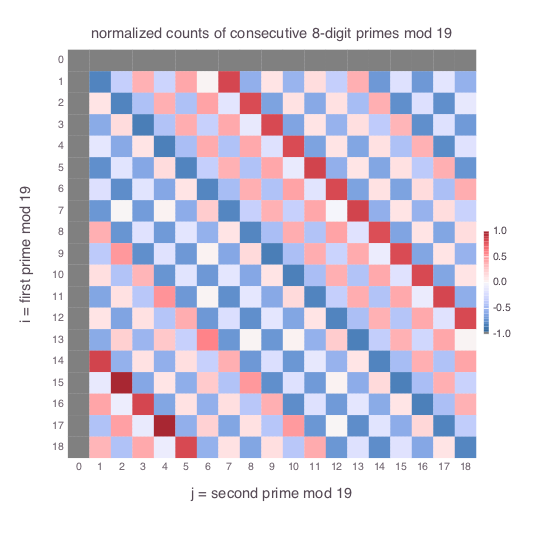

In [46]:
Gadfly.set_default_plot_size(400pt, 400pt)
hm19cramer_x2_x3_x19 = heatmap_z(c_x2x3x19_8million10000001mod19)

In [47]:
draw(SVG("graphics/heatmap-8-digit-cramersx2x3x19-1000001-mod-19.svg", 400pt, 400pt), hm19cramer_x2_x3_x19)

### The fair die

Generating and vizualizing purely (pseudo)random numbers.

In [29]:
function fair_die(faces, throws)
    tallies = zeros(Int, faces)
    for i = 1:throws
        tallies[rand(1:faces)] += 1
    end
    return tallies, std(tallies)
end

fair_die (generic function with 1 method)

In [30]:
function generate_random_sequence(range, reps, filename_prefix)
    label = string(rand(100000:999999))
    filename = join([filename_prefix, first(range), last(range), reps, label, "txt"], "-", ".")
    open(filename, "w") do f
        for i = 1:reps
            println(f, rand(range))
        end
    end
    return filename
end

generate_random_sequence (generic function with 1 method)

In [ ]:
generate_random_sequence(1:6, 1000000, "randoms/randoms")

In [ ]:
# given a path to a file of random integers,
# returns a statistical analysis organized
# as a data dictionary

function calc_randoms_d(filename)
    
    # read the file of intgers into a vector
    randoms = Array{Int}(0)
    
    open(filename, "r") do f
        while !eof(f)
            # chomp removes the newline char
            r = parse(Int, chomp(readline(f)))
            push!(randoms, r)
        end
    end

    # associative structure to hold all data on randoms
    d = Dict()
    
    # identify the source of the data
    d[:filename] = filename
    
    # number of integers in the file
    d[:r_count] = length(randoms)
    
    d[:bot] = minimum(randoms)
    d[:top] = maximum(randoms)
    
    # arrays of zeros to hold counts of residue classes and consecutive pairs
    class_counts = zeros(Int, d[:top])
    pair_counts = zeros(Int, (d[:top], d[:top]))
    
    # loop through the integers, recording the count of each value
    # and the number of each r_{i}, r_{i+1} pair of successive values
    prev = randoms[1]
    class_counts[prev] += 1
    for i = 2:length(randoms)
        next = randoms[i]
        class_counts[next] += 1
        pair_counts[prev, next] += 1
        prev = next
    end
    
    # store the counts in the dictionary
    d[:class_counts] = class_counts
    d[:pair_counts] = pair_counts
    
    # normalize the results to allow comparisons of samples of different sizes
    mc = mean(d[:class_counts])
    mp = mean(d[:pair_counts])
    d[:norm_class_counts] = map(x -> (x - mc) / mc, d[:class_counts])
    d[:norm_pair_counts] = map(x -> (x - mp) / mp, d[:pair_counts])
    
    # elementary stats on the normalized results
    d[:norm_class_counts_mean] = mean(d[:norm_class_counts])
    d[:norm_class_counts_std] = std(d[:norm_class_counts])
    d[:norm_pair_counts_mean] = mean(d[:norm_pair_counts])
    d[:norm_pair_counts_std] = std(d[:norm_pair_counts])
    d[:diag_ratio] = diagonal_ratio(d[:norm_pair_counts])
    return d
end

In [ ]:
r589417 = calc_randoms_d("randoms/randoms-1-6-1000000-589417.txt")

In [ ]:
function heatmap_randoms(d::Dict)
    mat = clamp_colors(d[:norm_pair_counts])
    labels = collect(d[:bot]:d[:top])
    spy(mat,
#    Guide.xticks(ticks = collect(d[:bot]:d[:top])),
#    Guide.yticks(ticks = collect(d[:bot]:d[:top])),
    Scale.x_discrete(labels = x -> string(labels[x])),
    Scale.y_discrete(labels = y -> string(labels[y])),
    Guide.xlabel("j = second throw"),
    Guide.ylabel("i = first throw", orientation=:vertical),
    Guide.title("consecutive throws of a simulated " * string(d[:top]) * "-side die"),
    Guide.colorkey(""),
    Scale.color_continuous(colormap = colorfn, minvalue = -1.0, maxvalue = 1.0))
end

In [ ]:
function heatmap(d::Dict)
    mat = clamp_colors(d[:norm_nz_pair_counts])
    labels = d[:congruence_classes]
    spy(mat,
        Scale.x_discrete(labels = x -> string(labels[x])),
        Scale.y_discrete(labels = y -> string(labels[y])),
        Guide.xlabel("j = second prime mod " * string(d[:m])),
        Guide.ylabel("i = first prime mod " * string(d[:m]), orientation=:vertical),
        Guide.title("normalized counts of consecutive " * string(d[:digits]) * "-digit primes mod " * string(d[:m])),
        Guide.colorkey(""),
        Scale.color_continuous(colormap = colorfn, minvalue = -1.0, maxvalue = 1.0))
end

In [ ]:
hm_randoms = heatmap_randoms(r589417)

In [ ]:
draw(SVG("graphics/heatmap-fair-die.svg", 400pt, 400pt), hm_randoms)

In [ ]:
[x - 166667 for x in r589417[:class_counts]]

In [ ]:
std(r589417[:class_counts])

In [ ]:
map(x -> x - 27778, r589417[:pair_counts])

In [ ]:
std(r589417[:pair_counts])

### Chebyshev bias

In [ ]:
chebyshev_split(3, 100)

In [178]:
function chebyshev_bias(filename)
    primes = read_primes_from_file(filename)
    bias = [0, 0, 0]
    for p in primes
        bias[Int(p % 4)] += 1
    end
    return bias[1], bias[3]
end

chebyshev_bias (generic function with 1 method)

In [179]:
chebyshev_bias("myriads/primes-400-10000-4039520.txt")

(4995,5005)

In [ ]:
function list_chebyshev_bias(path, filespec)
    filenames = readdir(path)
    biases = []
    for file in filenames
        if ismatch(filespec, file)
            counts = countResiduesFromFile(path * file, base)
            nzCts = nzCounts(counts, classes)
            ratio = diagonalDiscrepancy(nzCts[2])
            magnitude = nzCts[3]
            push!(ratios, (magnitude, ratio))
        end
    end
    sort!(ratios)
    xs = Float64[]
    ys = Float64[]
    for pair in ratios
        push!(xs, pair[1])
        push!(ys, pair[2])
    end
    return (xs, ys)
end


### Extras and miscellany

This is the junk drawer: Bits of code that proved useful at some point
in the programming process, but are unlikely to be of further interest now.

In [ ]:
# Return an array of tuples (p, p % m). The only
# use for this function was to generate data for 
# a table near the beginning of the bit-player article.
# (See below.)

function primes_and_mods(start, count, m)
    start = BigInt(start)
    p = next_prime(start)
    out = []
    for i = 1:count
        push!(out, (p, p % m))
        p = next_prime(p)
    end
    return out
end

In [ ]:
primes_and_mods(10000000, 20, 13)

In [ ]:
# When writing the matrix display functions I needed
# to know what range of values I might run into.
# This routine prints out the max and min pair counts found in each
# file of primes in a specified path.

# example call: collect_extrema("myriads/", r"primes-4\d-.*", 19)
# prints stats for files "primes-40-..." to "primes-49-..."


function collect_extrema(path, filespec, m)
    filenames = readdir(path)
    for file in filenames
        if ismatch(filespec, file)
            println(file)
            data = calc_primes_d_mod_m(path * file, m)
            println(ceil(data[:magnitude]), "  ", minimum(data[:norm_nz_pair_counts]), "  ", maximum(data[:norm_nz_pair_counts]))
        end
    end
end

In [ ]:
collect_extrema("millions/", r"primes", 7)

In [ ]:
collect_extrema("millions/", r"primes", 19)

In [167]:
# Get mean, median, and standard deviation of first differences
# between all primes (or other numbers) in a file.


function stats_prime_diffs(filename)
    primes = read_primes_from_file(filename)
    diffs = map(x -> convert(Int, x), diff(primes))
    stats = Dict(
    "mean" => mean(diffs),
    "std" => std(diffs),    # not too meaningful because very nonnormal
    "median" => median(diffs))
    return(stats)
end

stats_prime_diffs (generic function with 1 method)

In [168]:
stats_prime_diffs("millions/primes-8-1000000-10000019.txt")

Dict{ASCIIString,Float64} with 3 entries:
  "median" => 12.0
  "mean"   => 16.683504683504683
  "std"    => 14.064446573972273

In [169]:
stats_prime_diffs("millions/primes-40-1000000-9166432.txt")

Dict{ASCIIString,Float64} with 3 entries:
  "median" => 66.0
  "mean"   => 91.95231395231396
  "std"    => 88.72919255680372

In [170]:
stats_prime_diffs("millions/primes-400-1000000-6567379.txt")

Dict{ASCIIString,Float64} with 3 entries:
  "median" => 638.0
  "mean"   => 919.7319297319298
  "std"    => 915.7093219038056

In [ ]:
function interval_pair_search(filename, interval)
    primes = read_primes_from_file(filename)
    hits = []
    prev = primes[1]
    for p in primes[2:end]
        if p - prev == interval
            push!(hits, (prev, p))
        end
        prev = p
    end
    return hits
end


In [ ]:
interval_pair_search("millions/primes-8-1000000-1000001.txt", 38 * 1)